## Jugando a las 4 en raya (Kaggle - connectx) - rAIvenclaw
Ejercicios y pruebas sobre el mini-curso de Kaggle 
<br>"Intro to game AI and reinforcement learning"
<br>https://www.kaggle.com/learn/intro-to-game-ai-and-reinforcement-learning



In [5]:
# Instalar librerías

!pip install kaggle_environments

In [6]:
# Importar librerías

from kaggle_environments import make, evaluate
import random
import numpy as np 

## Aprendiendo sobre Kaggle environment connectx
+ info en https://github.com/Kaggle/kaggle-environments

In [8]:
# Métodos y atributos de la libería env
env = make("connectx", debug=True)

print (dir(env))

['_Environment__agent_runner', '_Environment__get_shared_state', '_Environment__get_state', '_Environment__process_specification', '_Environment__run_interpreter', '_Environment__set_state', '_Environment__state_schema', '_Environment__state_schema_value', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__state_schema_0', '__state_schema_1', '__str__', '__subclasshook__', '__weakref__', 'agents', 'clone', 'configuration', 'debug', 'debug_print', 'done', 'html_renderer', 'id', 'info', 'interpreter', 'logs', 'name', 'play', 'pool', 'render', 'renderer', 'reset', 'run', 'specification', 'state', 'step', 'steps', 'toJSON', 'train', 'version']


In [9]:
# Create the game environment
# Set debug=True to see the errors if your agent refuses to run

env = make("connectx", debug=True)

# List of available default agents
print(list(env.agents))

['random', 'negamax']


Tenemos dos agentes por defecto. El aleatorio y en negamax que juega mejor que el aleatorio

In [10]:
# Dos agentes aleatorios compitiendo y mostrando la partida con env.render

# Two random agents play one game round
env.run(["random", "random"])

# Show the game
env.render(mode="ipython")

In [11]:
# Estado del tablero
# env.state es lista con el estado visto por agent_1  y agent_2
# cada movimiento es una classe accesible como diccionario
# En el tablero 0 vacío, 1 agente_1, 2 agente_2 

print ("env.state es tipo", type(env.state))
print (env.state)
print ("tipo de elemento en lista env.state", type(env.state[0]))
print (env.state[0].action)
print (env.state[0].observation)
print (env.state[0].observation.board)
print (np.array(env.state[0].observation.board).reshape([6,7]))
print ("Tablero agente_1", env.state[0])
print ("Tablero agente_2", env.state[1])


env.state es tipo <class 'list'>
[{'action': 0, 'reward': -1, 'info': {}, 'observation': {'remainingOverageTime': 60, 'step': 30, 'board': [0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 1, 0, 0, 2, 0, 1, 2, 2, 0, 1, 1, 2, 2, 2, 2, 0, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2], 'mark': 1}, 'status': 'DONE'}, {'action': 2, 'reward': 1, 'info': {}, 'observation': {'remainingOverageTime': 60, 'mark': 2}, 'status': 'DONE'}]
tipo de elemento en lista env.state <class 'kaggle_environments.utils.Struct'>
0
{'remainingOverageTime': 60, 'step': 30, 'board': [0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 1, 0, 0, 2, 0, 1, 2, 2, 0, 1, 1, 2, 2, 2, 2, 0, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2], 'mark': 1}
[0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 2, 1, 0, 0, 2, 0, 1, 2, 2, 0, 1, 1, 2, 2, 2, 2, 0, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2]
[[0 1 0 0 1 1 0]
 [0 1 0 0 2 1 0]
 [0 2 0 1 2 2 0]
 [1 1 2 2 2 2 0]
 [2 2 1 1 1 2 2]
 [1 2 1 2 1 1 2]]
Tablero agente_1 {'action': 0, 'reward': -1, 'info': {}, 'observation': {'remainingOvera

In [16]:
# Mostrando un entrenamiento

# Play as first position against random agent.
trainer = env.train([None, "random"])
observation = trainer.reset()
counter = 0 

def agent(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return random.choice(valid_moves)

while not env.done:
    my_action = agent(observation, env.configuration)
    observation, reward, done, info = trainer.step(my_action)
    print("Agent", observation.mark)
    print("My Action",counter, "is", my_action)
    print ("observation", observation)
    print ("reward", reward)
    print ("done",done)
    print ("info",info)
    
    print (env.render(mode="ansi"))
    counter +=1

    # env.render(mode="ipython", width=100, height=90, header=False, controls=False)

Agent 1
My Action 0 is 2
observation {'remainingOverageTime': 60, 'step': 2, 'board': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0], 'mark': 1}
reward 0
done False
info {}
+---+---+---+---+---+---+---+
| 0 | 0 | 0 | 0 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+
| 0 | 0 | 0 | 0 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+
| 0 | 0 | 0 | 0 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+
| 0 | 0 | 0 | 0 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+
| 0 | 0 | 0 | 0 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+
| 0 | 0 | 1 | 2 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+

Agent 1
My Action 1 is 4
observation {'remainingOverageTime': 60, 'step': 4, 'board': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 2, 1, 0, 0], 'mark': 1}
reward 0
done False
info {}
+---+---+---+---+---+---+---+
| 0 | 0 | 0 | 0 | 0 | 0 | 0 |
+---+---+---+---+---+---+---+
| 0 | 0 | 0 |

## Probando con distintos agentes

In [17]:
# Programa de varios agentes (random, columna del medio y columna más a a la izquierda)

# Selects random valid column
def agent_random(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return random.choice(valid_moves)

# Selects middle column
def agent_middle(obs, config):
    return config.columns//2

# Selects leftmost valid column
def agent_leftmost(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return valid_moves[0]

In [18]:
# Agents play one game round
env.run([agent_leftmost, agent_random])

# Show the game
env.render(mode="ipython")

In [19]:
# Función que devuelve qué agente tiene más victorias en 100 rounds

def get_win_percentages(agent1, agent2, n_rounds=100):
    # Use default Connect Four setup
    config = {'rows': 6, 'columns': 7, 'inarow': 4}
    # Agent 1 goes first (roughly) half the time          
    outcomes = evaluate("connectx", [agent1, agent2], config, [], n_rounds//2)
    # Agent 2 goes first (roughly) half the time      
    outcomes += [[b,a] for [a,b] in evaluate("connectx", [agent2, agent1], config, [], n_rounds-n_rounds//2)]
    print("Agent 1 Win Percentage:", np.round(outcomes.count([1,-1])/len(outcomes), 2))
    print("Agent 2 Win Percentage:", np.round(outcomes.count([-1,1])/len(outcomes), 2))
    print("Number of Invalid Plays by Agent 1:", outcomes.count([None, 0]))
    print("Number of Invalid Plays by Agent 2:", outcomes.count([0, None]))

In [20]:
# Prueba de desempeño del agente_1 = medio + agente_2 = random

get_win_percentages(agent1=agent_middle, agent2=agent_random)

Agent 1 Win Percentage: 0.73
Agent 2 Win Percentage: 0.01
Number of Invalid Plays by Agent 1: 26
Number of Invalid Plays by Agent 2: 0


In [21]:
# Prueba de desempeño del agente_1 = medio + agente_2 = random

get_win_percentages(agent1=agent_leftmost, agent2=agent_random)

Agent 1 Win Percentage: 0.81
Agent 2 Win Percentage: 0.19
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [22]:
# Prueba de desempeño del agente_1 = random + agente_2 = random

get_win_percentages(agent1=agent_random, agent2=agent_random)

Agent 1 Win Percentage: 0.5
Agent 2 Win Percentage: 0.5
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [23]:
# Gets board at next step if agent drops piece in selected column
def drop_piece(grid, col, piece, config):
    next_grid = grid.copy()
    for row in range(config.rows-1, -1, -1):
        if next_grid[row][col] == 0:
            break
    next_grid[row][col] = piece
    return next_grid

# Returns True if dropping piece in column results in game win
def check_winning_move(obs, config, col, piece):
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    next_grid = drop_piece(grid, col, piece, config)
    # horizontal
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(next_grid[row,col:col+config.inarow])
            if window.count(piece) == config.inarow:
                return True
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(next_grid[row:row+config.inarow,col])
            if window.count(piece) == config.inarow:
                return True
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(next_grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if window.count(piece) == config.inarow:
                return True
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(next_grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if window.count(piece) == config.inarow:
                return True
    return False

In [24]:
# Agente que detecta movimientos ganadores y los ejecuta

def agent_q1(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    for move in valid_moves:
      if check_winning_move(obs, config, move, piece=obs.mark):
        return move
    return random.choice(valid_moves)

In [25]:
env.run([agent_q1, agent_random])
env.render(mode="ipython")

In [26]:
# Mejoramos agente anterior también bloquedando movimientos ganadores del contrincante

def agent_q2(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    for move in valid_moves:
        if check_winning_move(obs, config, move, piece=obs.mark):
            return move            
        elif check_winning_move(obs, config, move, piece=obs.mark%2+1):
            return move
    return random.choice(valid_moves)

In [27]:
# partida q1 y q2 (q2 debe de ser mejor)

env.run([agent_q1, agent_q2])
env.render(mode="ipython")

In [28]:
# rendimiento q1 vs q2 (q2 debe de ser mejor)

get_win_percentages(agent1=agent_q1, agent2=agent_q2)

Agent 1 Win Percentage: 0.18
Agent 2 Win Percentage: 0.82
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [29]:
# rendimiento q2 vs kaggle -negamaz
get_win_percentages(agent1=agent_q2, agent2='negamax')

Agent 1 Win Percentage: 0.32
Agent 2 Win Percentage: 0.53
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [30]:
env = make("connectx", debug=True)
env.play([agent_q2, None], width=500, height=450)

## Agente Heurístico

In [31]:
# Mejoramos con agente heuristico 

# Calculates score if agent drops piece in selected column
def score_move(grid, col, mark, config):
    next_grid = drop_piece(grid, col, mark, config)
    score = get_heuristic(next_grid, mark, config)
    return score

# Helper function for score_move: gets board at next step if agent drops piece in selected column
def drop_piece(grid, col, mark, config):
    next_grid = grid.copy()
    for row in range(config.rows-1, -1, -1):
        if next_grid[row][col] == 0:
            break
    next_grid[row][col] = mark
    return next_grid

# Helper function for score_move: calculates value of heuristic for grid
def get_heuristic(grid, mark, config):
    num_threes = count_windows(grid, 3, mark, config)
    num_fours = count_windows(grid, 4, mark, config)
    num_threes_opp = count_windows(grid, 3, mark%2+1, config)
    score = num_threes - 1e2*num_threes_opp + 1e6*num_fours
    return score

# Helper function for get_heuristic: checks if window satisfies heuristic conditions
def check_window(window, num_discs, piece, config):
    return (window.count(piece) == num_discs and window.count(0) == config.inarow-num_discs)
    
# Helper function for get_heuristic: counts number of windows satisfying specified heuristic conditions
def count_windows(grid, num_discs, piece, config):
    num_windows = 0
    # horizontal
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    return num_windows


In [32]:
# agente heuristico que mejora los anteriores

# The agent is always implemented as a Python function that accepts two arguments: obs and config

def agent_heur(obs, config):
    # Get list of valid moves
    valid_moves = [c for c in range(config.columns) if obs.board[c] == 0]
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    # Use the heuristic to assign a score to each possible board in the next turn
    scores = dict(zip(valid_moves, [score_move(grid, col, obs.mark, config) for col in valid_moves]))
    # Get a list of columns (moves) that maximize the heuristic
    max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
    # Select at random from the maximizing columns
    return random.choice(max_cols)

In [33]:
# partida entre heuristico y random

env.run([agent_heur, "random"])

# Show the game
env.render(mode="ipython")

In [34]:
# rendimiento agent_heur vs random (agent_heur debe de ser mejor)

get_win_percentages(agent1=agent_heur, agent2="random")

Agent 1 Win Percentage: 0.99
Agent 2 Win Percentage: 0.01
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [35]:
# rendimiento agent_heur vs kaggle-magamax (agent_heur debe de ser mejor)

get_win_percentages(agent1=agent_heur, agent2='negamax')

Agent 1 Win Percentage: 0.54
Agent 2 Win Percentage: 0.38
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [36]:
  # agente heuristico mejorado

  def agent_heur2(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    for col in valid_moves:
        if check_winning_move(obs, config, col, piece=obs.mark%2+1):
            return col
        else: 
            grid = np.asarray(obs.board).reshape(config.rows, config.columns)
            # Use the heuristic to assign a score to each possible board in the next turn
            scores = dict(zip(valid_moves, [score_move(grid, col, obs.mark, config) for col in valid_moves]))
            # Get a list of columns (moves) that maximize the heuristic
            max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
            # Select at random from the maximizing columns
            return random.choice(max_cols) 

In [37]:
# rendimiento agent_heur vs agent_heur2 (agent_heur2 debe de ser mejor)

get_win_percentages(agent1=agent_heur, agent2=agent_heur2)

Agent 1 Win Percentage: 0.47
Agent 2 Win Percentage: 0.53
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


## Agente N-step Look-ahead

In [38]:
# Gets board at next step if agent drops piece in selected column

def drop_piece(grid, col, mark, config):
    next_grid = grid.copy()
    for row in range(config.rows-1, -1, -1):
        if next_grid[row][col] == 0:
            break
    next_grid[row][col] = mark
    return next_grid

# Helper function for get_heuristic: checks if window satisfies heuristic conditions
def check_window(window, num_discs, piece, config):
    return (window.count(piece) == num_discs and window.count(0) == config.inarow-num_discs)
    
# Helper function for get_heuristic: counts number of windows satisfying specified heuristic conditions
def count_windows(grid, num_discs, piece, config):
    num_windows = 0
    # horizontal
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    return num_windows

In [39]:
# Helper function for minimax: calculates value of heuristic for grid
def get_heuristic(grid, mark, config):
    num_threes = count_windows(grid, 3, mark, config)
    num_fours = count_windows(grid, 4, mark, config)
    num_threes_opp = count_windows(grid, 3, mark%2+1, config)
    num_fours_opp = count_windows(grid, 4, mark%2+1, config)
    score = num_threes - 1e2*num_threes_opp - 1e4*num_fours_opp + 1e6*num_fours
    return score

In [40]:
# Uses minimax to calculate value of dropping piece in selected column

def score_move(grid, col, mark, config, nsteps):
    next_grid = drop_piece(grid, col, mark, config)
    score = minimax(next_grid, nsteps-1, False, mark, config)
    return score

# Helper function for minimax: checks if agent or opponent has four in a row in the window
def is_terminal_window(window, config):
    return window.count(1) == config.inarow or window.count(2) == config.inarow

# Helper function for minimax: checks if game has ended
def is_terminal_node(grid, config):
    # Check for draw 
    if list(grid[0, :]).count(0) == 0:
        return True
    # Check for win: horizontal, vertical, or diagonal
    # horizontal 
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if is_terminal_window(window, config):
                return True
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if is_terminal_window(window, config):
                return True
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if is_terminal_window(window, config):
                return True
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if is_terminal_window(window, config):
                return True
    return False

# Minimax implementation
def minimax(node, depth, maximizingPlayer, mark, config):
    is_terminal = is_terminal_node(node, config)
    valid_moves = [c for c in range(config.columns) if node[0][c] == 0]
    if depth == 0 or is_terminal:
        return get_heuristic(node, mark, config)
    if maximizingPlayer:
        value = -np.Inf
        for col in valid_moves:
            child = drop_piece(node, col, mark, config)
            value = max(value, minimax(child, depth-1, False, mark, config))
        return value
    else:
        value = np.Inf
        for col in valid_moves:
            child = drop_piece(node, col, mark%2+1, config)
            value = min(value, minimax(child, depth-1, True, mark, config))
        return value


In [41]:
# Agente 3 steps-look ahead

# How deep to make the game tree: higher values take longer to run!

N_STEPS = 3

def agent_la(obs, config):
    # Get list of valid moves
    valid_moves = [c for c in range(config.columns) if obs.board[c] == 0]
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    # Use the heuristic to assign a score to each possible board in the next step
    scores = dict(zip(valid_moves, [score_move(grid, col, obs.mark, config, N_STEPS) for col in valid_moves]))
    # Get a list of columns (moves) that maximize the heuristic
    max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
    # Select at random from the maximizing columns
    return random.choice(max_cols)



In [42]:
# Two random agents play one game round
env.run([agent_la, "random"])

# Show the game
env.render(mode="ipython")

In [43]:
# rendimiento agent_la vs random(agent_la debe de ser mejor)

get_win_percentages(agent1=agent_la, agent2="random")

Agent 1 Win Percentage: 0.99
Agent 2 Win Percentage: 0.01
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [44]:
# rendimiento agent_la vs Kaggle-negamax

get_win_percentages(agent1=agent_la, agent2='negamax')

Agent 1 Win Percentage: 0.69
Agent 2 Win Percentage: 0.19
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


## Deep Reinforcement learning

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

!pip install 'tensorflow==1.15.0'

import tensorflow as tf
from kaggle_environments import make, evaluate
from gym import spaces

!apt-get update
!apt-get install -y cmake libopenmpi-dev python3-dev zlib1g-dev
!pip install "stable-baselines[mpi]==2.9.0"

from stable_baselines.bench import Monitor 
from stable_baselines.common.vec_env import DummyVecEnv
from stable_baselines import PPO1, A2C, ACER, ACKTR, TRPO
from stable_baselines.a2c.utils import conv, linear, conv_to_fc
from stable_baselines.common.policies import CnnPolicy

# esta clase es para interactuar con gym de openAI
class ConnectFourGym:
    def __init__(self, agent2="random"):
        ks_env = make("connectx", debug=True)
        self.env = ks_env.train([None, agent2])
        self.rows = ks_env.configuration.rows
        self.columns = ks_env.configuration.columns
        # Learn about spaces here: http://gym.openai.com/docs/#spaces
        self.action_space = spaces.Discrete(self.columns)
        self.observation_space = spaces.Box(low=0, high=2, 
                                            shape=(self.rows,self.columns,1), dtype=np.int)
        # Tuple corresponding to the min and max possible rewards
        self.reward_range = (-10, 1)
        # StableBaselines throws error if these are not defined
        self.spec = None
        self.metadata = None
    def reset(self):
        self.obs = self.env.reset()
        return np.array(self.obs['board']).reshape(self.rows,self.columns,1)
    def change_reward(self, old_reward, done):
        if old_reward == 1: # The agent won the game
            return 1
        elif done: # The opponent won the game
            return -1
        else: # Reward 1/42
            return 1/(self.rows*self.columns)
    def step(self, action):
        # Check if agent's move is valid
        is_valid = (self.obs['board'][int(action)] == 0)
        if is_valid: # Play the move
            self.obs, old_reward, done, _ = self.env.step(int(action))
            reward = self.change_reward(old_reward, done)
        else: # End the game and penalize agent
            reward, done, _ = -10, True, {}
        return np.array(self.obs['board']).reshape(self.rows,self.columns,1), reward, done, _
    
# Entrenamos contra random
# Create ConnectFour environment
env = ConnectFourGym(agent2="random")

# Create directory for logging training information
log_dir = "log/"
os.makedirs(log_dir, exist_ok=True)

# Logging progress
monitor_env = Monitor(env, log_dir, allow_early_resets=True)

# Create a vectorized environment
vec_env = DummyVecEnv([lambda: monitor_env])

# Red neuronal de aprendizaje
# Neural network for predicting action values
def modified_cnn(scaled_images, **kwargs):
    activ = tf.nn.relu
    layer_1 = activ(conv(scaled_images, 'c1', n_filters=32, filter_size=3, stride=1, 
                         init_scale=np.sqrt(2), **kwargs))
    layer_2 = activ(conv(layer_1, 'c2', n_filters=64, filter_size=3, stride=1, 
                         init_scale=np.sqrt(2), **kwargs))
    layer_2 = conv_to_fc(layer_2)
    return activ(linear(layer_2, 'fc1', n_hidden=512, init_scale=np.sqrt(2)))  

class CustomCnnPolicy(CnnPolicy):
    def __init__(self, *args, **kwargs):
        super(CustomCnnPolicy, self).__init__(*args, **kwargs, cnn_extractor=modified_cnn)















Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


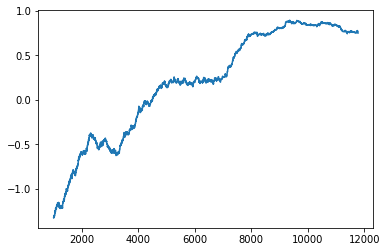

In [46]:
# Utilizamos modelo PP01

# Initialize agent
model = PPO1(CustomCnnPolicy, vec_env, verbose=0)

# Train agent
model.learn(total_timesteps=100000)

# Plot cumulative reward
with open(os.path.join(log_dir, "monitor.csv"), 'rt') as fh:    
    firstline = fh.readline()
    assert firstline[0] == '#'
    df = pd.read_csv(fh, index_col=None)['r']
df.rolling(window=1000).mean().plot()
plt.show()

In [51]:
def agent_drl(obs, config):
    # Use the best model to select a column
    col, _ = model.predict(np.array(obs['board']).reshape(6,7,1))
    # Check if selected column is valid
    is_valid = (obs['board'][int(col)] == 0)
    # If not valid, select random move. 
    if is_valid:
        return int(col)
    else:
        return random.choice([col for col in range(config.columns) if obs.board[int(col)] == 0])


In [53]:
# rendimiento agent_drl vs random(agent_la debe de ser mejor)

get_win_percentages(agent1=agent_drl, agent2="random")

Agent 1 Win Percentage: 0.79
Agent 2 Win Percentage: 0.21
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


## Mejoras

 

*   Cambiar modelos  PPO1 (A2C, ACER, ACKTR or TRPO)
*   Modificar recompensas
*   Modificar agente de entrenamiento a agent_la
*   Cambiar la red reuronal






Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor



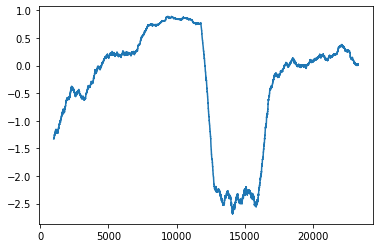

In [54]:
# Utilizamos modelo A2C

# Initialize agent
model = A2C(CustomCnnPolicy, vec_env, verbose=0)

# Train agent
model.learn(total_timesteps=100000)

# Plot cumulative reward
with open(os.path.join(log_dir, "monitor.csv"), 'rt') as fh:    
    firstline = fh.readline()
    assert firstline[0] == '#'
    df = pd.read_csv(fh, index_col=None)['r']
df.rolling(window=1000).mean().plot()
plt.show()

Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.



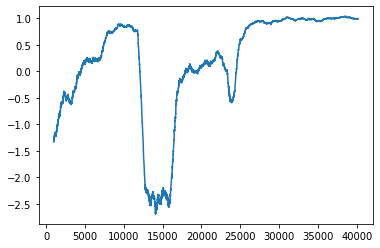

In [55]:
# Utilizamos modelo ACER

# Initialize agent
model = ACER(CustomCnnPolicy, vec_env, verbose=0)

# Train agent
model.learn(total_timesteps=100000)

# Plot cumulative reward
with open(os.path.join(log_dir, "monitor.csv"), 'rt') as fh:    
    firstline = fh.readline()
    assert firstline[0] == '#'
    df = pd.read_csv(fh, index_col=None)['r']
df.rolling(window=1000).mean().plot()
plt.show()

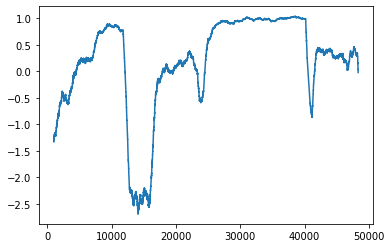

In [57]:
# Utilizamos modelo ACKTR, rebajados los timesteps porque se hace muy largo el entrenamiento

# Initialize agent
model = ACKTR(CustomCnnPolicy, vec_env, verbose=0)

# Train agent
model.learn(total_timesteps=1000)

# Plot cumulative reward
with open(os.path.join(log_dir, "monitor.csv"), 'rt') as fh:    
    firstline = fh.readline()
    assert firstline[0] == '#'
    df = pd.read_csv(fh, index_col=None)['r']
df.rolling(window=1000).mean().plot()
plt.show()
 

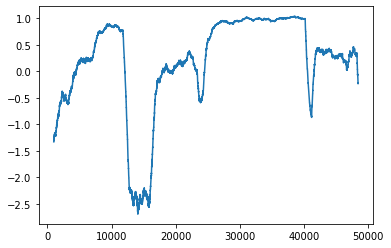

In [58]:
# Utilizamos modelo TRPO, rebajados los timesteps porque se hace muy largo el entrenamiento

# Initialize agent
model = TRPO(CustomCnnPolicy, vec_env, verbose=0)

# Train agent
model.learn(total_timesteps=1000)

# Plot cumulative reward
with open(os.path.join(log_dir, "monitor.csv"), 'rt') as fh:    
    firstline = fh.readline()
    assert firstline[0] == '#'
    df = pd.read_csv(fh, index_col=None)['r']
df.rolling(window=1000).mean().plot()
plt.show()

# La gráfica de abajo nos da el entrenamiento itegral por todos los modelos

## Mejoras   
*   Cambiar modelos  PPO1 (A2C, ACER, ACKTR or TRPO) --> realizado el que mejor funciona de los entrenados es **ACER**

*   Modificar recompensas
*   Modificar agente de entrenamiento a agent_la
*   Cambiar la red reuronal



In [47]:
## Se puede coger el agente que mejor resultado de y subirlo a la competicion Kaggle. 
## Para que funcione habrá que guardar el modelo en fichero con los pesos y luego cargarlo para realizar las predicciones dentro del agente

## Write Submission File 
###(Por si se quiere subir el modelo a la competición Kaggle)

In [ ]:
import inspect
import os

def write_agent_to_file(function, file):
    with open(file, "a" if os.path.exists(file) else "w") as f:
        f.write(inspect.getsource(function))
        print(function, "written to", file)

write_agent_to_file(my_agent, "submission.py")

## Validate Submission

In [ ]:
# Note: Stdout replacement is a temporary workaround.
import sys
out = sys.stdout
submission = utils.read_file("/kaggle/working/submission.py")
agent = utils.get_last_callable(submission)
sys.stdout = out

env = make("connectx", debug=True)
env.run([agent, agent])
print("Success!" if env.state[0].status == env.state[1].status == "DONE" else "Failed...")